# Lab 3

In this lab exercise, you will look at applying an edge detector. We will use several functions from [scikit-image](https://scikit-image.org) to perform edge detection and visualisation. 

You are asked to write a short (no more than 2 pages) report of your work, answering specific questions, and showing example images. This work is not assessed (it will not count towards your module mark) but you will get formative feedback. 

### Task 1

Work your way through the script below. Using online documentation, understand how each function works, from edge detection, Hough Transform and line detection. Write a summary of how this algorithm works.

In [1]:
#

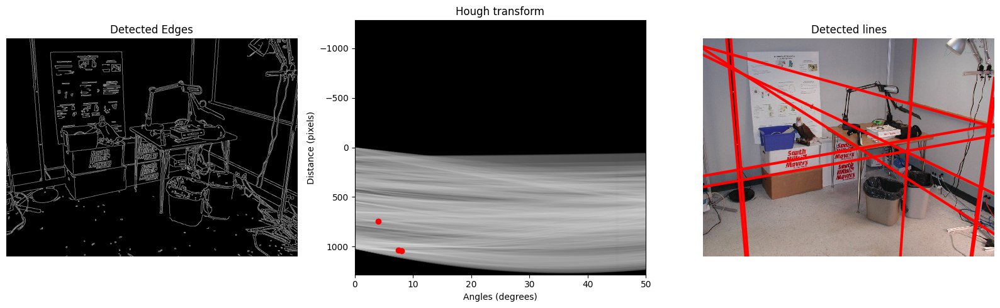

In [14]:
# Lab 3: Hough Transform

#This script is based off the following guide: https://scikit-image.org/docs/stable/auto_examples/edges/plot_line_hough_transform.html

# Imports

from skimage import io
from matplotlib import pyplot as plt
import numpy as np
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line
from skimage.color import rgb2gray
from skimage.feature import canny
from matplotlib import cm
from skimage.filters import sobel, roberts, prewitt, gaussian, laplace

## First we will read the image and find edges
# Read image
img = io.imread('cluttera2.jpg')

# The image is RGB and we need to convert to grayscale
img_grey = rgb2gray(img)

# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = canny(img_grey)

# Configure the figure
fig, axes = plt.subplots(1, 3,figsize=(16, 5))
ax = axes.ravel()

ax[0].imshow(img_edges, cmap=cm.gray)
ax[0].set_title('Detected Edges')
ax[0].set_axis_off()

# Classic straight-line Hough transform
# Evaluate angles from -pi/2 to pi/2 and returning 360 points in that interval evenly spaced
# NOTE: We can decide what angles we are going to try.
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=False)
# hough_line returns
# h: matrix, which is the matrix A[angle, radius] from the lecture (or our acumulator)
# theta: is array with all the angles used is the same as our tested_angles
# d: is all the radius calculated following w = x*cos(theta) + y*sin(theta)
h, theta, d = hough_line(img_edges, theta=tested_angles)


# NOTE: I suppose peaks are the interceptions
# the non-maximum suppression is used over the h-space accumulator to reduce the number of detected lineas 
# to a manageable amount. It practically (after thresholding) suppresses all the non-maximum values in the
# accumulator, leaving only the local maxima points in the hough space.
# housh_line_peaks returns
# accum: the accumulator array only counting the votes.
# angles: the angles of the peaks
# dists: the distances of the peaks
accum, angles, dists = hough_line_peaks(h,theta,d,threshold=1,num_peaks=10)

# NOTE: this diff function is pretty handy, it returns the difference item[i+1] - item[i]
angle_step = 0.5 * np.diff(theta).mean()
d_step = 0.5 * np.diff(d).mean()
# Create the boundaries to plot the hough space
bounds = [np.rad2deg(theta[0] - angle_step),
          np.rad2deg(theta[-1] + angle_step),
          d[-1] + d_step, d[0] - d_step]

# Plot each of the peak lines on the hough space
for i in range(0,len(angles)):
    ax[1].plot(np.rad2deg(angles[i]),dists[i],'ro')

# Plot the hough space: They use np.log(1 + h) to enhance the contrast
# 1 + h if h == 0, we can calculate log(0), so we add 1 to avoid that
ax[1].imshow(np.log(1 + h), extent=bounds, cmap=cm.gray,aspect=0.1)

ax[1].set_title('Hough transform')
ax[1].set_xlabel('Angles (degrees)')
ax[1].set_ylabel('Distance (pixels)')

ax[1].axis('auto')
ax[1].set_xlim(0,50)

# Plot Figure 3: Detected Lines
for i in range(0,len(angles)):
    # By using the equation w = x*cos(theta) + y*sin(theta) we can calculate the x0 and y0
    (x0, y0) = dists[i] * np.array([np.cos(angles[i]), np.sin(angles[i])])
    # We can calculate the slope of the line using the tangent of the angle
    ax[2].axline((x0, y0),slope=np.tan(angles[i] + np.pi/2), color="red", linewidth=3)

ax[2].set_ylim((img.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines')

io.imshow(img)
plt.show()


### Task 2

What is the effect of increasing/decreasing the required number of peaks in ‘houghpeaks’?

In [3]:
# whol
def complete_hough_transformation(img_edges, threshold = 1, num_peaks = 10):
    # Configure the figure
    fig, axes = plt.subplots(1, 3,figsize=(16, 5))
    ax = axes.ravel()

    ax[0].imshow(img_edges, cmap=cm.gray)
    ax[0].set_title('Detected Edges')
    ax[0].set_axis_off()

    # Classic straight-line Hough transform
    # Evaluate angles from -pi/2 to pi/2 and returning 360 points in that interval evenly spaced
    tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=False)
    # hough_line returns
    # h: matrix, which is the matrix A[angle, radius] from the lecture (or our acumulator)
    # theta: is array with all the angles used is the same as our tested_angles
    # d: is all the radius calculated following w = x*cos(theta) + y*sin(theta)
    h, theta, d = hough_line(img_edges, theta=tested_angles)

    # NOTE: I suppose peaks are the interceptions
    # the non-maximum suppression is used over the h-space accumulator to reduce the number of detected lineas 
    # to a manageable amount. It practically (after thresholding) suppresses all the non-maximum values in the
    # accumulator, leaving only the local maxima points in the hough space.
    # housh_line_peaks returns
    # accum: the accumulator array only counting the votes.
    # angles: the angles of the peaks
    # dists: the distances of the peaks
    accum, angles, dists = hough_line_peaks(h,theta,d,threshold=threshold,num_peaks=num_peaks)

    # NOTE: this diff function is pretty handy, it returns the difference item[i+1] - item[i]
    angle_step = 0.5 * np.diff(theta).mean()
    d_step = 0.5 * np.diff(d).mean()
    # Create the boundaries to plot the hough space
    bounds = [np.rad2deg(theta[0] - angle_step),
            np.rad2deg(theta[-1] + angle_step),
            d[-1] + d_step, d[0] - d_step]

    # Plot each of the peak lines on the hough space
    for i in range(0,len(angles)):
        ax[1].plot(np.rad2deg(angles[i]),dists[i],'ro')

    # Plot the hough space: They use np.log(1 + h) to enhance the contrast
    # 1 + h if h == 0, we can calculate log(0), so we add 1 to avoid that
    ax[1].imshow(np.log(1 + h), extent=bounds, cmap=cm.gray,aspect=0.1)

    ax[1].set_title('Hough transform')
    ax[1].set_xlabel('Angles (degrees)')
    ax[1].set_ylabel('Distance (pixels)')

    ax[1].axis('auto')
    ax[1].set_xlim(0,50)

    # Plot Figure 3: Detected Lines
    for i in range(0,len(angles)):
        # By using the equation w = x*cos(theta) + y*sin(theta) we can calculate the x0 and y0
        (x0, y0) = dists[i] * np.array([np.cos(angles[i]), np.sin(angles[i])])
        # We can calculate the slope of the line using the tangent of the angle
        ax[2].axline((x0, y0),slope=np.tan(angles[i] + np.pi/2), color="red", linewidth=3)

    ax[2].set_ylim((img.shape[0], 0))
    ax[2].set_axis_off()
    ax[2].set_title('Detected lines')

    io.imshow(img)
    plt.show()

Num peaks:  1


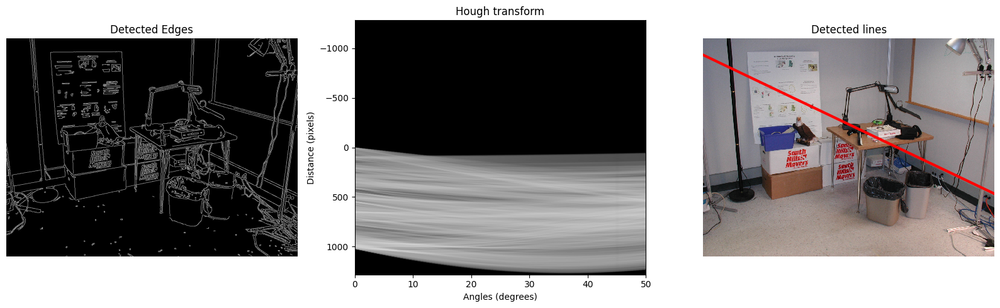

Num peaks:  5


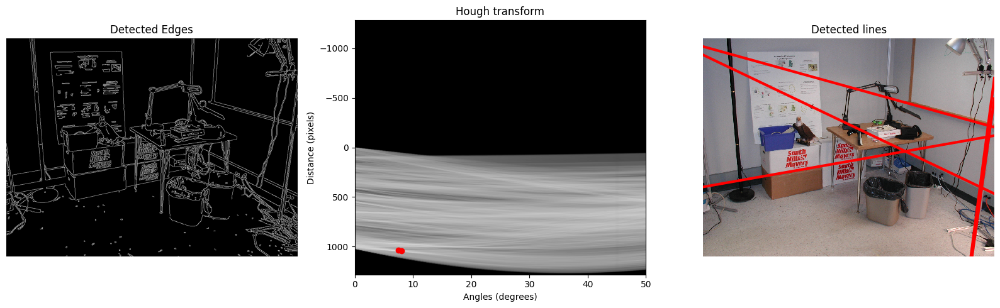

Num peaks:  9


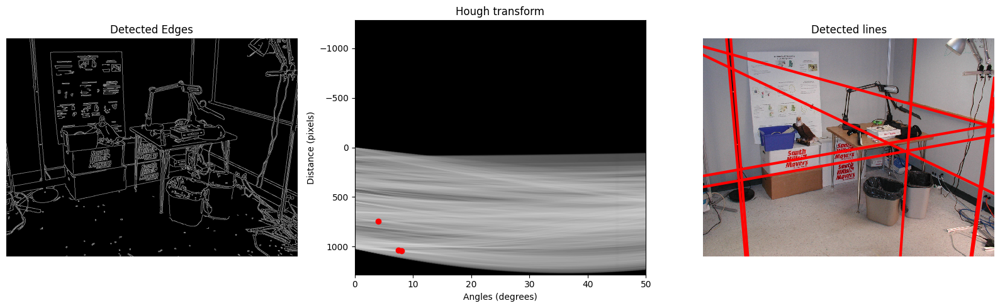

Num peaks:  13


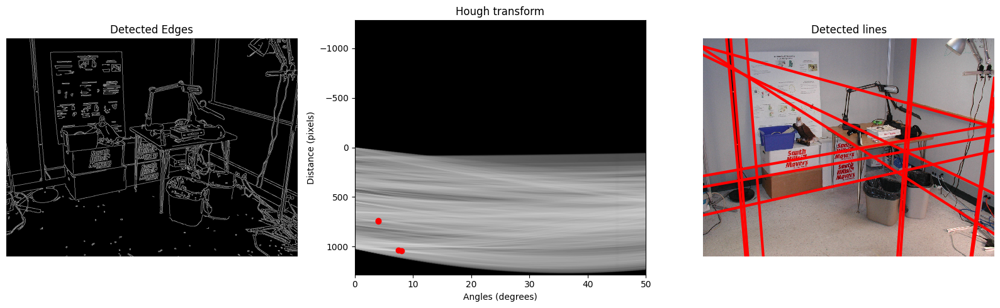

Num peaks:  17


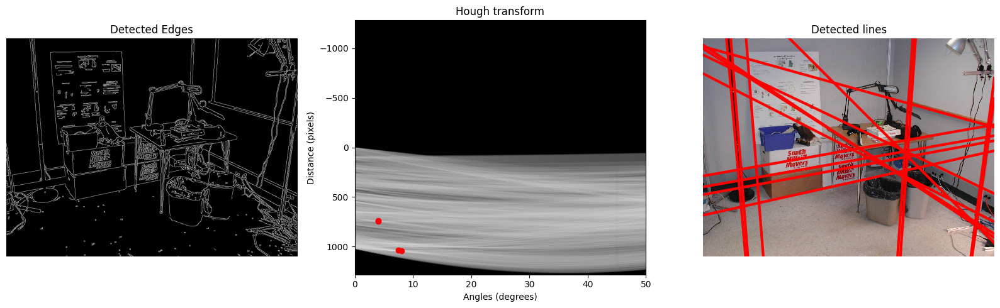

In [4]:
# NOTE: More threshold more top peaks, and consequently more lines detected
for num_peaks in range(1, 21, 4):
    print("Num peaks: ", num_peaks)
    complete_hough_transformation(img_edges, 1, num_peaks)

Threshold:  250


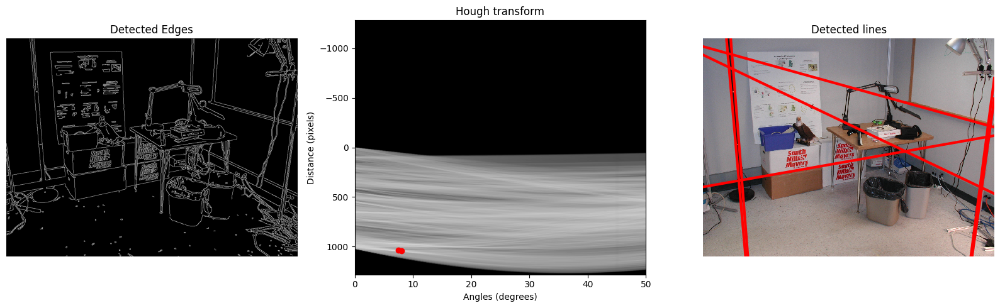

Threshold:  260


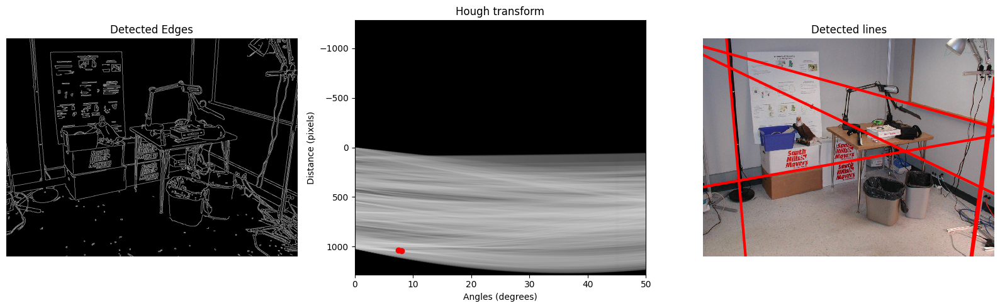

Threshold:  270


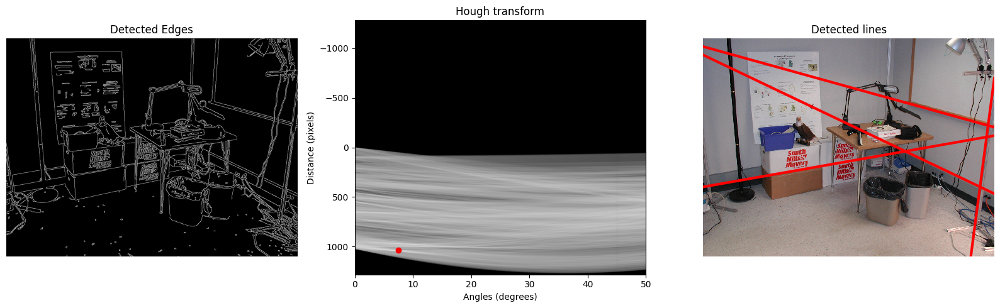

Threshold:  280


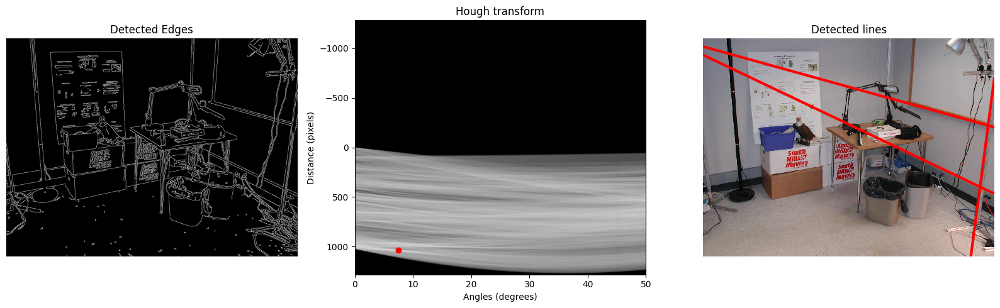

Threshold:  290


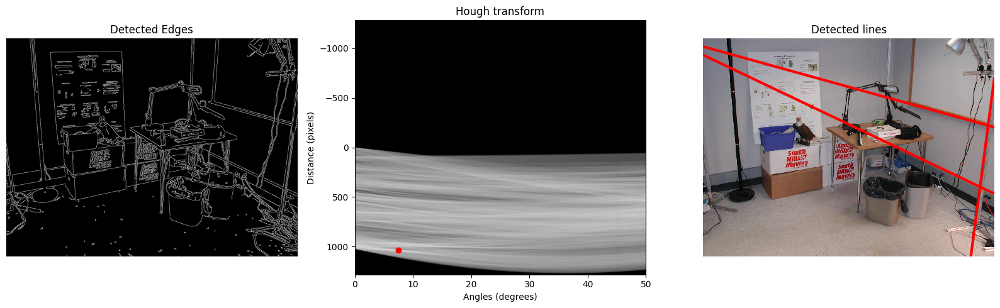

In [5]:
# NOTE: More threshold more top peaks, and consequently more lines detected
for threshold in range(250, 300, 10):
    print("Threshold: ", threshold)
    complete_hough_transformation(img_edges, threshold, 10)

### Task 3 

Replace the Canny Edge detector with other algorithms. Which one do you think performs best and why?

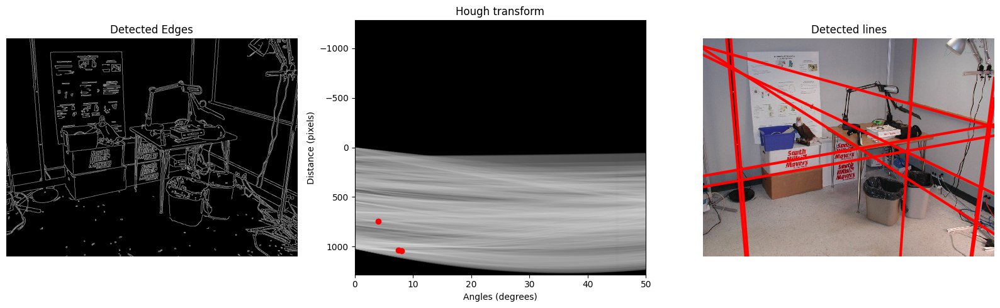

In [6]:
# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = canny(img_grey)

complete_hough_transformation(img_edges, 1, 10)

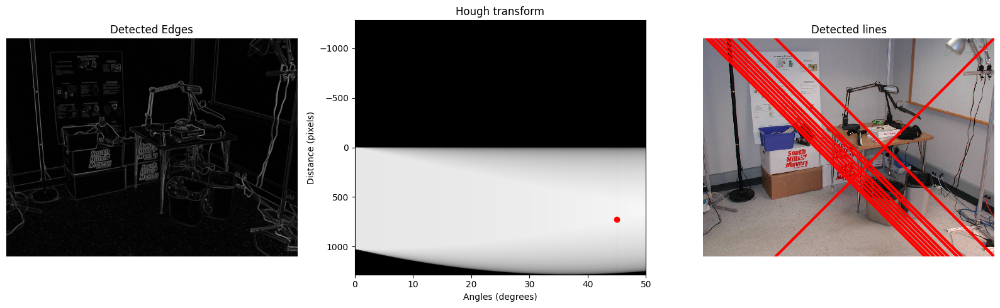

In [7]:
# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = sobel(img_grey)

complete_hough_transformation(img_edges, 1, 10)

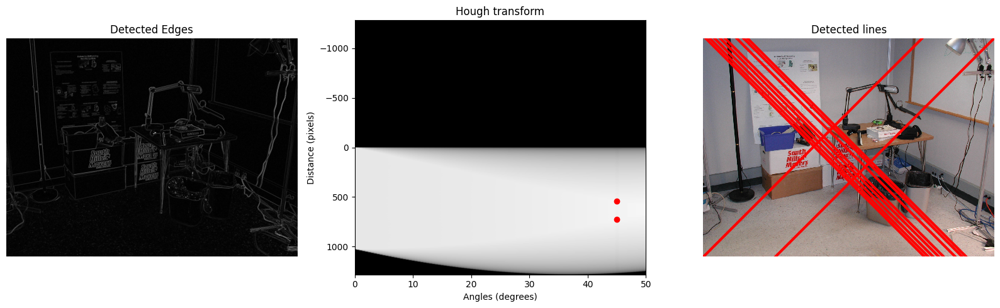

In [8]:
# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = roberts(img_grey)

complete_hough_transformation(img_edges, 1, 10)

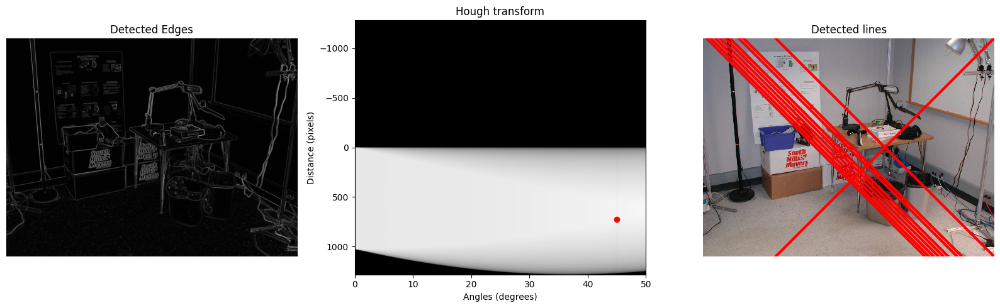

In [9]:
# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = prewitt(img_grey)

complete_hough_transformation(img_edges, 1, 10)

In [10]:
# The simplest approach is to threshold the LoG output at zero.
# However, this technique may bias the location of the zero crossing 
# edge toward either the light or dark side of the edge.
# A better approach considers points on both sides of the threshold 
# boundary and chooses the one with the lowest absolute magnitude of 
# the Laplacian, which is closer to the zero crossing1.

def zero_cross(image):
    z_c_image = np.zeros(image.shape)
    thresh = np.absolute(image).mean() * 0.75
    h,w = image.shape
    for y in range(1, h - 1):
        for x in range(1, w - 1):
            patch = image[y-1:y+2, x-1:x+2]
            p = image[y, x]
            maxP = patch.max()
            minP = patch.min()
            if (p > 0):
                zeroCross = True if minP < 0 else False
            else:
                zeroCross = True if maxP > 0 else False
            if ((maxP - minP) > thresh) and zeroCross:
                z_c_image[y, x] = 1
    return z_c_image

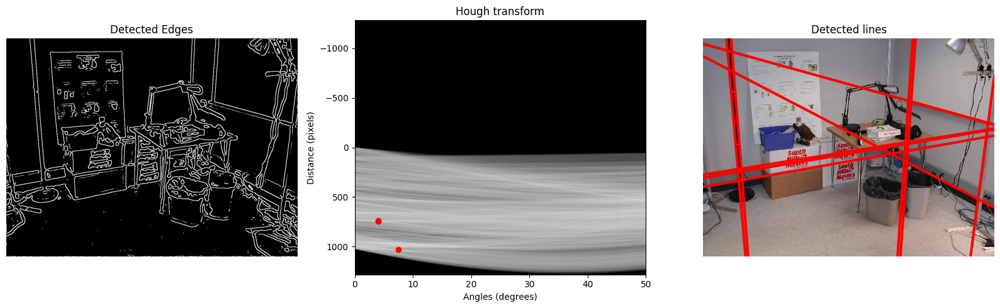

In [13]:
# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = gaussian(img_grey, sigma= 4, truncate=5.0)
# img_edges = ndimage.gaussian_filter(img_grey, sigma=1, radius=2)
img_edges = laplace(img_edges)
img_edges = zero_cross(img_edges)

complete_hough_transformation(img_edges, 1, 10)

### Task 4 

Examine the guide for Probabilistic Hough Transform: https://scikit-image.org/docs/stable/auto_examples/edges/plot_line_hough_transform.html#probabilistic-hough-transform. Apply probabilistic hough transform to the provided image. Describe in the report how this algorithm works, particularly when finding the start/finish of a line.

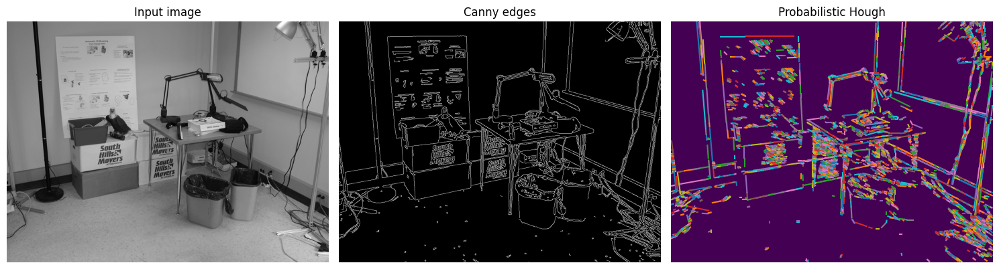

In [16]:
# Imports
from skimage.transform import  probabilistic_hough_line

## First we will read the image and find edges
# Read image
img = io.imread('cluttera2.jpg')

# The image is RGB and we need to convert to grayscale
img_grey = rgb2gray(img)

# Apply your favourite edge detector: Here I am using Built-in Canny
img_edges = canny(img_grey)

lines = probabilistic_hough_line(img_edges, threshold=10, line_length=5,
                                 line_gap=3)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(img_grey, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(img_edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(img_edges * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, img_grey.shape[1]))
ax[2].set_ylim((img_grey.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()
